In [69]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.style
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

from sklearn.metrics import (
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
    roc_auc_score,
    precision_recall_curve,
    roc_curve,
)


Problem Statement

Businesses or companies can fall prey to default if they are not able to keep up their debt obligations. Defaults will lead to a lower credit rating for the company which in turn reduces its chances of getting credit in the future and may have to pay higher interests on existing debts as well as any new obligations. From an investor's point of view, he would want to invest in a company if it is capable of handling its financial obligations, can grow quickly, and is able to manage the growth scale.

A balance sheet is a financial statement of a company that provides a snapshot of what a company owns, owes, and the amount invested by the shareholders. Thus, it is an important tool that helps evaluate the performance of a business.

Data that is available includes information from the financial statement of the companies for the previous year (2015). Also, information about the Networth of the company in the following year (2016) is provided which can be used to drive the labeled field.

In [2]:
df=pd.read_excel('Company_Data2015-1.xlsx')

In [3]:
df.head()

,Co_Code,Co_Name,Networth Next Year,Equity Paid Up,Networth,Capital Employed,Total Debt,Gross Block,Net Working Capital,Current Assets,...,PBIDTM (%)[Latest],PBITM (%)[Latest],PBDTM (%)[Latest],CPM (%)[Latest],APATM (%)[Latest],Debtors Velocity (Days),Creditors Velocity (Days),Inventory Velocity (Days),Value of Output/Total Assets,Value of Output/Gross Block
0,16974,Hind.Cables,-8021.60,419.36,-7027.48,-1007.24,5936.03,474.30,-1076.34,40.50,...,0.00,0.00,0.00,0.00,0.00,0,0,45.0,0.00,0.00
1,21214,Tata Tele. Mah.,-3986.19,1954.93,-2968.08,4458.20,7410.18,9070.86,-1098.88,486.86,...,-10.30,-39.74,-57.74,-57.74,-87.18,29,101,2.0,0.31,0.24
2,14852,ABG Shipyard,-3192.58,53.84,506.86,7714.68,6944.54,1281.54,4496.25,9097.64,...,-5279.14,-5516.98,-7780.25,-7723.67,-7961.51,97,558,0.0,-0.03,-0.26
3,2439,GTL,-3054.51,157.30,-623.49,2353.88,2326.05,1033.69,-2612.42,1034.12,...,-3.33,-7.21,-48.13,-47.70,-51.58,93,63,2.0,0.24,1.90
4,23505,Bharati Defence,-2967.36,50.30,-1070.83,4675.33,5740.90,1084.20,1836.23,4685.81,...,-295.55,-400.55,-845.88,379.79,274.79,3887,346,0.0,0.01,0.05


In [4]:
df.tail()

,Co_Code,Co_Name,Networth Next Year,Equity Paid Up,Networth,Capital Employed,Total Debt,Gross Block,Net Working Capital,Current Assets,...,PBIDTM (%)[Latest],PBITM (%)[Latest],PBDTM (%)[Latest],CPM (%)[Latest],APATM (%)[Latest],Debtors Velocity (Days),Creditors Velocity (Days),Inventory Velocity (Days),Value of Output/Total Assets,Value of Output/Gross Block
3581,4987,HDFC Bank,72677.77,501.30,62009.42,590576.00,496009.19,8463.30,0.00,444633.50,...,0.00,0.00,0.00,0.00,0.00,0,0,NaN,0.60,7.76
3582,502,Vedanta,79162.19,296.50,34057.87,71906.06,37643.79,29848.44,2503.86,11554.45,...,39.92,32.17,29.81,30.52,22.77,13,53,77.0,0.29,1.00
3583,12002,I O C L,88134.31,2427.95,67969.97,140686.75,55245.01,121643.45,6376.84,89609.82,...,8.09,6.69,7.31,5.69,4.29,7,30,48.0,1.42,3.24
3584,12001,NTPC,91293.70,8245.46,81657.35,173099.14,85995.34,128477.59,11449.79,42353.59,...,28.12,20.55,23.39,19.55,11.99,32,69,42.0,0.36,0.68
3585,15542,Bharti Airtel,111729.10,1998.70,78270.80,104241.00,21569.70,100084.90,-12145.30,11947.10,...,42.47,22.88,34.04,25.97,6.37,18,74,0.0,0.42,0.49


In [5]:
df.shape

(3586, 67)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3586 entries, 0 to 3585
Data columns (total 67 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Co_Code                              3586 non-null   int64  
 1   Co_Name                              3586 non-null   object 
 2   Networth Next Year                   3586 non-null   float64
 3   Equity Paid Up                       3586 non-null   float64
 4   Networth                             3586 non-null   float64
 5   Capital Employed                     3586 non-null   float64
 6   Total Debt                           3586 non-null   float64
 7   Gross Block                          3586 non-null   float64
 8   Net Working Capital                  3586 non-null   float64
 9   Current Assets                       3586 non-null   float64
 10  Current Liabilities and Provisions   3586 non-null   float64
 11  Total Assets/Liabilities      

In [7]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Co_Code,3586.0,16065.388734,19776.817379,4.00,3029.2500,6077.500,24269.5000,72493.00
Networth Next Year,3586.0,725.045251,4769.681004,-8021.60,3.9850,19.015,123.8025,111729.10
Equity Paid Up,3586.0,62.966584,778.761744,0.00,3.7500,8.290,19.5175,42263.46
Networth,3586.0,649.746299,4091.988792,-7027.48,3.8925,18.580,117.2975,81657.35
Capital Employed,3586.0,2799.611054,26975.135385,-1824.75,7.6025,39.090,226.6050,714001.25
...,...,...,...,...,...,...,...,...
Debtors Velocity (Days),3586.0,603.894032,10636.759580,0.00,8.0000,49.000,106.0000,514721.00
Creditors Velocity (Days),3586.0,2057.854992,54169.479197,0.00,8.0000,39.000,89.0000,2034145.00
Inventory Velocity (Days),3483.0,79.644559,137.847792,-199.00,0.0000,35.000,96.0000,996.00
Value of Output/Total Assets,3586.0,0.819757,1.201400,-0.33,0.0700,0.480,1.1600,17.63


In [8]:
df.duplicated().sum()

0

In [9]:
df.isnull().sum()

Co_Code                           0
Co_Name                           0
Networth Next Year                0
Equity Paid Up                    0
Networth                          0
                               ... 
Debtors Velocity (Days)           0
Creditors Velocity (Days)         0
Inventory Velocity (Days)       103
Value of Output/Total Assets      0
Value of Output/Gross Block       0
Length: 67, dtype: int64

In [10]:
df_dictionary=pd.read_excel('Data_Dictionary.xlsx')
df_dictionary

,#,Field Name,Description,New Field Name
0,1,Co_Code,Company Code,Co_Code
1,2,Co_Name,Company Name,Co_Name
2,3,Networth Next Year,Value of a company as on 2016 - Next Year(diff...,Networth_Next_Year
3,4,Equity Paid Up,Amount that has been received by the company t...,Equity_Paid_Up
4,5,Networth,Value of a company as on 2015 - Current Year,Networth
...,...,...,...,...
62,64,Debtors Velocity (Days),Average days required for receiving the payments,Debtors_Vel_Days
63,65,Creditors Velocity (Days),Average number of days company takes to pay su...,Creditors_Vel_Days
64,66,Inventory Velocity (Days),Average number of days the company needs to tu...,Inventory_Vel_Days
65,67,Value of Output/Total Assets,Ratio of Value of Output (market value) to Tot...,Value_of_Output_to_Total_Assets


In [11]:
# replacing column names with new field names from data dictionary
df.rename(columns=df_dictionary.set_index('Field Name')['New Field Name'],inplace=True)

In [12]:
df.head()

,Co_Code,Co_Name,Networth_Next_Year,Equity_Paid_Up,Networth,Capital_Employed,Total_Debt,Gross_Block,Net_Working_Capital,Curr_Assets,...,PBIDTM_perc_Latest,PBITM_perc_Latest,PBDTM_perc_Latest,CPM_perc_Latest,APATM_perc_Latest,Debtors_Vel_Days,Creditors_Vel_Days,Inventory_Vel_Days,Value_of_Output_to_Total_Assets,Value_of_Output_to_Gross_Block
0,16974,Hind.Cables,-8021.60,419.36,-7027.48,-1007.24,5936.03,474.30,-1076.34,40.50,...,0.00,0.00,0.00,0.00,0.00,0,0,45.0,0.00,0.00
1,21214,Tata Tele. Mah.,-3986.19,1954.93,-2968.08,4458.20,7410.18,9070.86,-1098.88,486.86,...,-10.30,-39.74,-57.74,-57.74,-87.18,29,101,2.0,0.31,0.24
2,14852,ABG Shipyard,-3192.58,53.84,506.86,7714.68,6944.54,1281.54,4496.25,9097.64,...,-5279.14,-5516.98,-7780.25,-7723.67,-7961.51,97,558,0.0,-0.03,-0.26
3,2439,GTL,-3054.51,157.30,-623.49,2353.88,2326.05,1033.69,-2612.42,1034.12,...,-3.33,-7.21,-48.13,-47.70,-51.58,93,63,2.0,0.24,1.90
4,23505,Bharati Defence,-2967.36,50.30,-1070.83,4675.33,5740.90,1084.20,1836.23,4685.81,...,-295.55,-400.55,-845.88,379.79,274.79,3887,346,0.0,0.01,0.05


In [13]:
df.drop(['Co_Code','Co_Name'],axis=1,inplace=True)

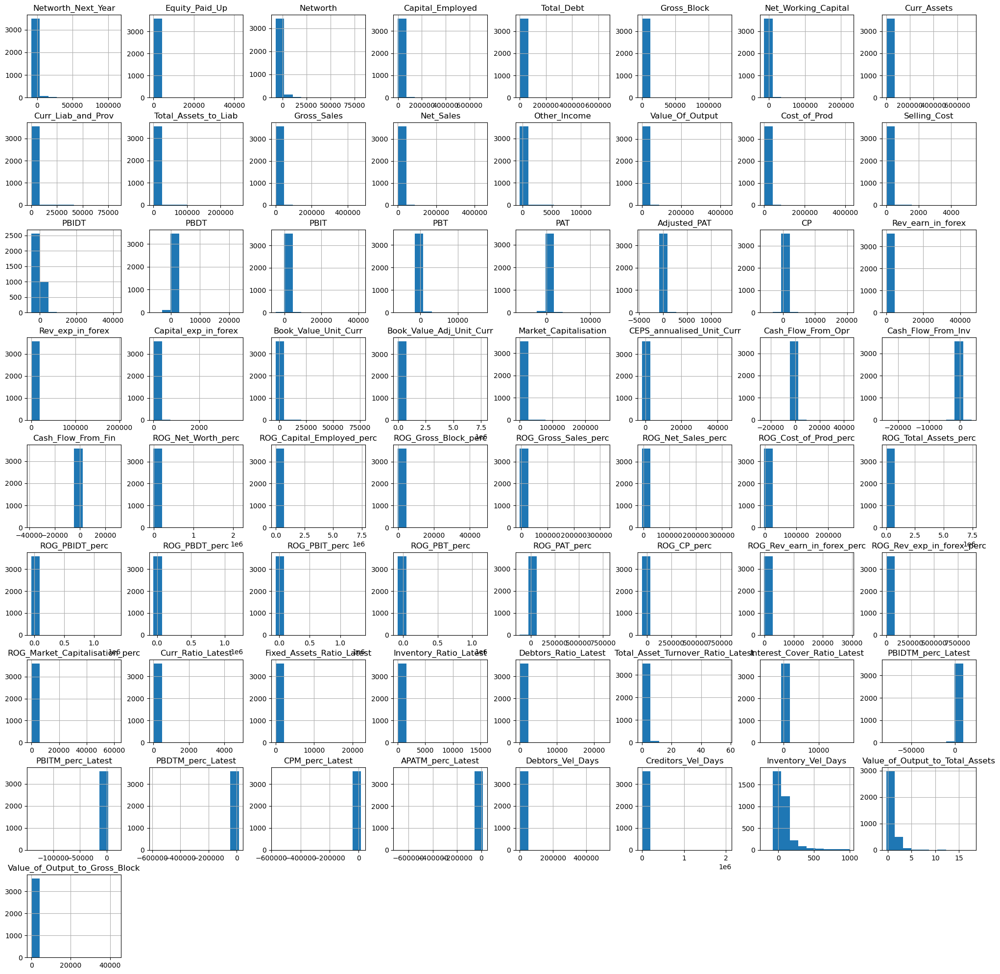

In [15]:
df.hist(figsize=(25,25));

Shape before Outliers Treatment (3586, 65)


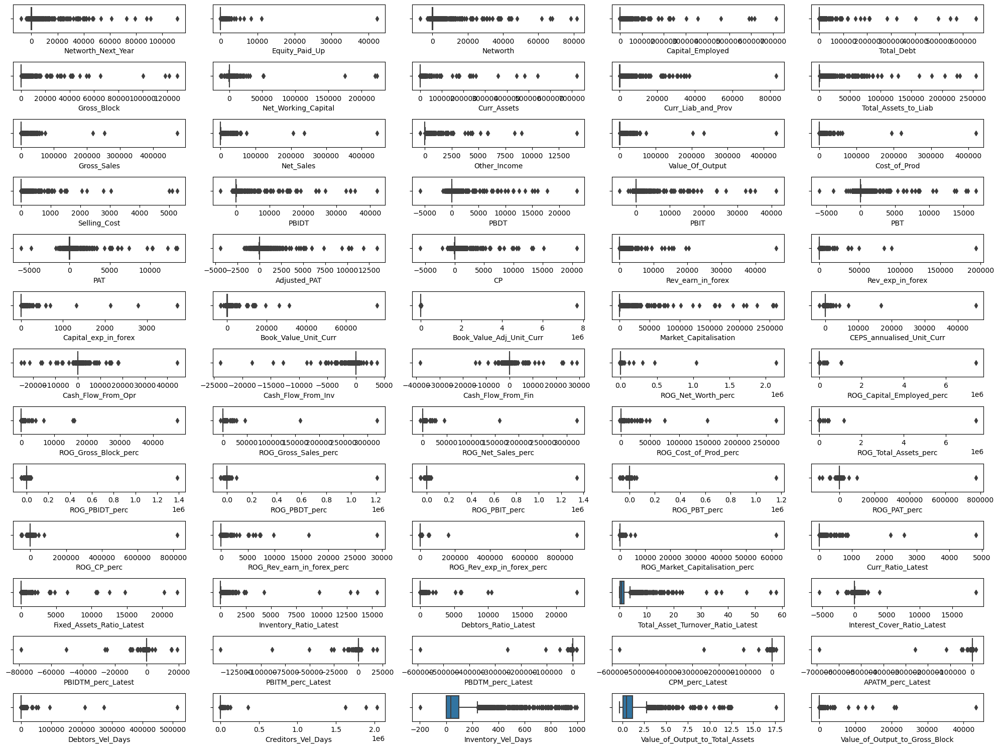

In [14]:
fig = plt.figure(figsize=(20,15))
for i in range(0, len(df.columns)):
    ax = fig.add_subplot(13, 5, i+1)
    sns.boxplot(x=df[df.columns[i]], ax=ax)  
    plt.tight_layout()

print('Shape before Outliers Treatment', df.shape)

In [16]:
# Treating outliers
def remove_outlier(col):
    Q1,Q3=np.percentile(col,[25,75])
    IQR=Q3-Q1
    lower_range=Q1-(1.5*IQR)
    upper_range=Q3+(1.5*IQR)
    return lower_range, upper_range

In [17]:
for column in df.columns:
    lr,ur=remove_outlier(df[column])
    df[column]=np.where(df[column]>ur,ur,df[column])
    df[column]=np.where(df[column]<lr,lr,df[column])


Shape before Outliers Treatment (3586, 65)


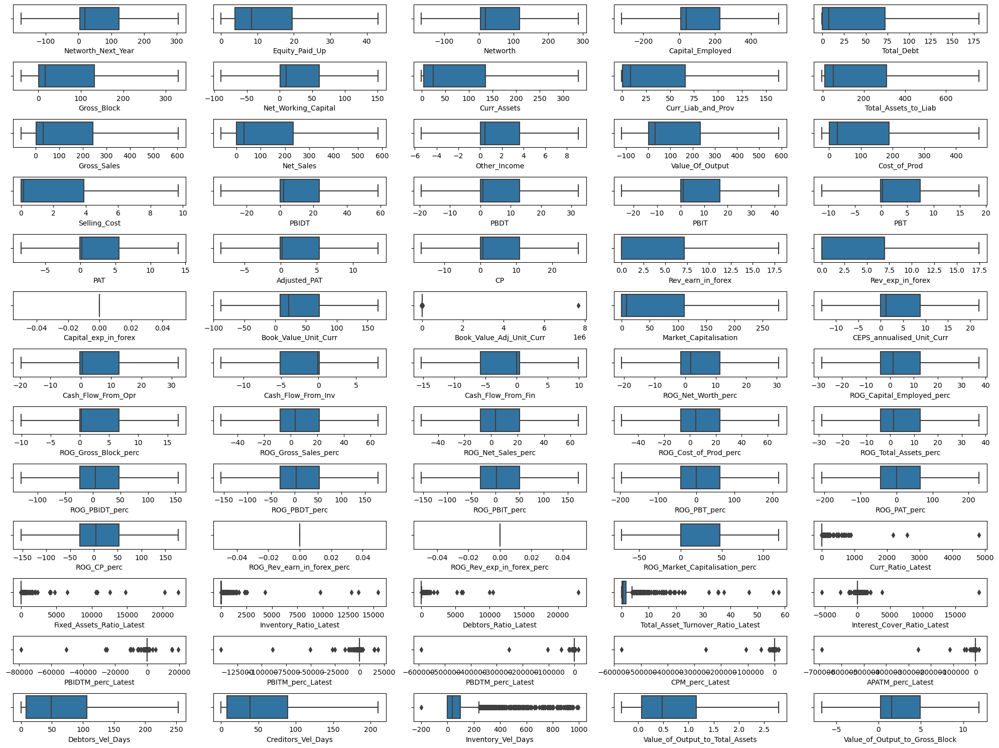

In [18]:
# boxplot after treating outliers
fig=plt.figure(figsize=(20,15));
for i in range(0,len(df.columns)):
    ax=fig.add_subplot(13,5,i+1)
    sns.boxplot(x=df[df.columns[i]], ax=ax)  
    plt.tight_layout()
print('Shape before Outliers Treatment',df.shape)


### Transform Target variable into 0 and 1

In [19]:
# creating a default variable that takes the value of 1 when net worth next year is negative & 0 when net worth next year is positive
df['default']=np.where((df['Networth_Next_Year']>0),0,1)

In [20]:
df[['default','Networth_Next_Year']].head()

,default,Networth_Next_Year
0,1,-175.74125
1,1,-175.74125
2,1,-175.74125
3,1,-175.74125
4,1,-175.74125


In [21]:
df.drop(['Networth_Next_Year'], axis=1, inplace=True)

In [22]:
df.head()

,Equity_Paid_Up,Networth,Capital_Employed,Total_Debt,Gross_Block,Net_Working_Capital,Curr_Assets,Curr_Liab_and_Prov,Total_Assets_to_Liab,Gross_Sales,...,PBITM_perc_Latest,PBDTM_perc_Latest,CPM_perc_Latest,APATM_perc_Latest,Debtors_Vel_Days,Creditors_Vel_Days,Inventory_Vel_Days,Value_of_Output_to_Total_Assets,Value_of_Output_to_Gross_Block,default
0,43.16875,-166.215,-320.90125,180.83,328.8825,-89.40625,40.50000,163.02625,109.6000,0.00000,...,0.00,0.00,0.00,0.00,0.0,0.0,45.0,0.00,0.00,1
1,43.16875,-166.215,555.10875,180.83,328.8825,-89.40625,332.19375,163.02625,760.5175,603.46125,...,-39.74,-57.74,-57.74,-87.18,29.0,101.0,2.0,0.31,0.24,1
2,43.16875,287.405,555.10875,180.83,328.8825,151.52375,332.19375,163.02625,760.5175,392.13000,...,-5516.98,-7780.25,-7723.67,-7961.51,97.0,210.5,0.0,-0.03,-0.26,1
3,43.16875,-166.215,555.10875,180.83,328.8825,-89.40625,332.19375,163.02625,760.5175,603.46125,...,-7.21,-48.13,-47.70,-51.58,93.0,63.0,2.0,0.24,1.90,1
4,43.16875,-166.215,555.10875,180.83,328.8825,151.52375,332.19375,163.02625,760.5175,38.72000,...,-400.55,-845.88,379.79,274.79,253.0,210.5,0.0,0.01,0.05,1


In [23]:
df['default'].value_counts()

0    3198
1     388
Name: default, dtype: int64

### Missing value treatment

In [24]:
df.isnull().sum().sort_values(ascending=False)

Inventory_Vel_Days           103
Book_Value_Adj_Unit_Curr       4
Fixed_Assets_Ratio_Latest      1
PBITM_perc_Latest              1
Curr_Ratio_Latest              1
                            ... 
Market_Capitalisation          0
CEPS_annualised_Unit_Curr      0
Cash_Flow_From_Opr             0
Cash_Flow_From_Inv             0
default                        0
Length: 65, dtype: int64

In [25]:
df.isnull().sum().sum()

118

In [26]:
#Imputing missing values
from sklearn.impute import KNNImputer
imputer = KNNImputer(n_neighbors=10)

In [27]:
df=pd.DataFrame(imputer.fit_transform(df),columns=df.columns)
df.isnull().sum()

Equity_Paid_Up                     0
Networth                           0
Capital_Employed                   0
Total_Debt                         0
Gross_Block                        0
                                  ..
Creditors_Vel_Days                 0
Inventory_Vel_Days                 0
Value_of_Output_to_Total_Assets    0
Value_of_Output_to_Gross_Block     0
default                            0
Length: 65, dtype: int64

In [28]:
df.isnull().sum().sum()

0

In [29]:
df.head()

,Equity_Paid_Up,Networth,Capital_Employed,Total_Debt,Gross_Block,Net_Working_Capital,Curr_Assets,Curr_Liab_and_Prov,Total_Assets_to_Liab,Gross_Sales,...,PBITM_perc_Latest,PBDTM_perc_Latest,CPM_perc_Latest,APATM_perc_Latest,Debtors_Vel_Days,Creditors_Vel_Days,Inventory_Vel_Days,Value_of_Output_to_Total_Assets,Value_of_Output_to_Gross_Block,default
0,43.16875,-166.215,-320.90125,180.83,328.8825,-89.40625,40.50000,163.02625,109.6000,0.00000,...,0.00,0.00,0.00,0.00,0.0,0.0,45.0,0.00,0.00,1.0
1,43.16875,-166.215,555.10875,180.83,328.8825,-89.40625,332.19375,163.02625,760.5175,603.46125,...,-39.74,-57.74,-57.74,-87.18,29.0,101.0,2.0,0.31,0.24,1.0
2,43.16875,287.405,555.10875,180.83,328.8825,151.52375,332.19375,163.02625,760.5175,392.13000,...,-5516.98,-7780.25,-7723.67,-7961.51,97.0,210.5,0.0,-0.03,-0.26,1.0
3,43.16875,-166.215,555.10875,180.83,328.8825,-89.40625,332.19375,163.02625,760.5175,603.46125,...,-7.21,-48.13,-47.70,-51.58,93.0,63.0,2.0,0.24,1.90,1.0
4,43.16875,-166.215,555.10875,180.83,328.8825,151.52375,332.19375,163.02625,760.5175,38.72000,...,-400.55,-845.88,379.79,274.79,253.0,210.5,0.0,0.01,0.05,1.0


### Univariate and Bivariate analysis

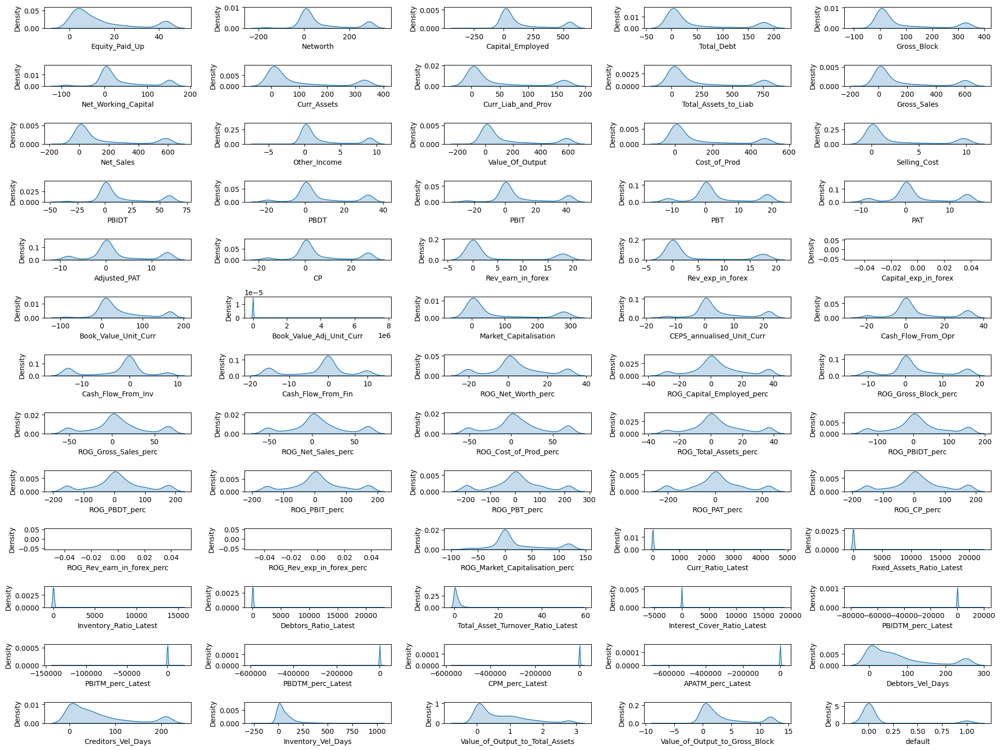

In [30]:
#density plot with hue based on default
fig = plt.figure(figsize=(20,15))
plot_cols = df.columns
for i in range(0, len(df.columns)):
    ax = fig.add_subplot(13, 5, i+1)
    sns.kdeplot(x=df[df.columns[i]], ax=ax,shade=True)
    plt.tight_layout()


ValueError: num must be an integer with 1 <= num <= 65, not 66

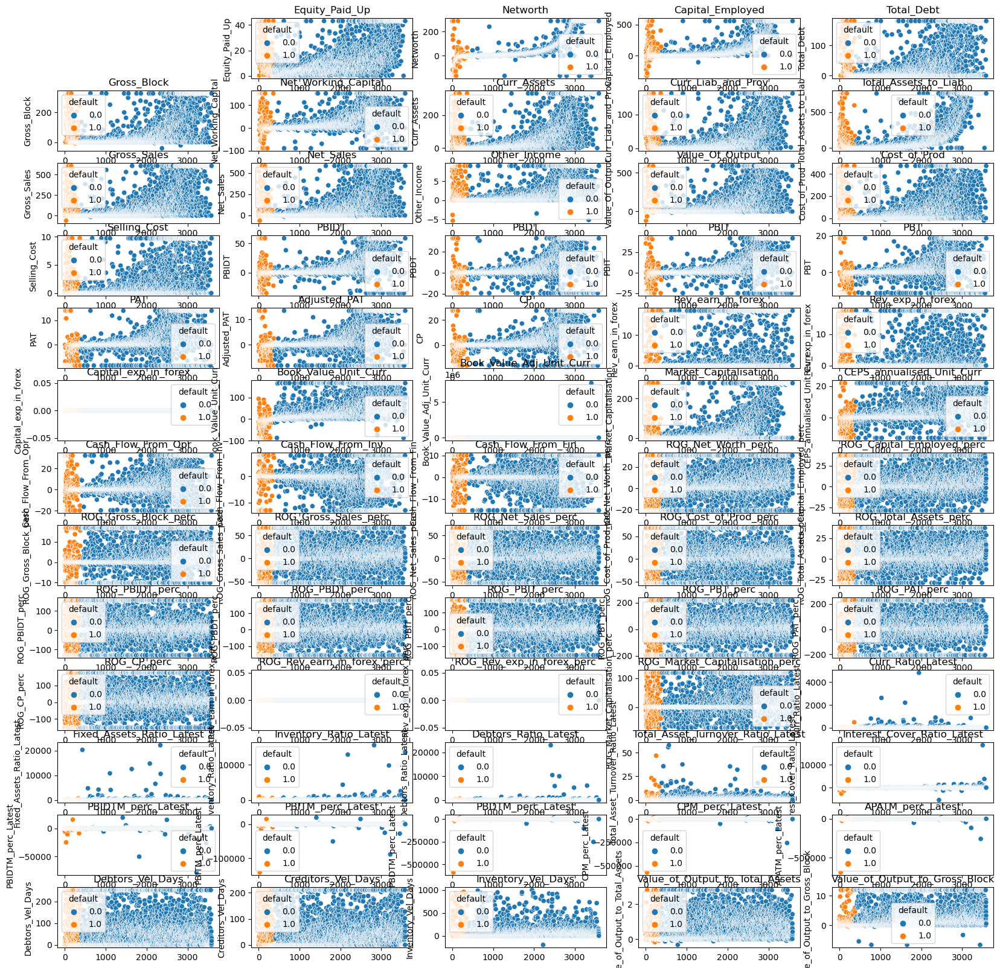

In [31]:
plot_cols = df.columns

plt.figure(figsize=(20, 20))
for i, col in enumerate(plot_cols, 1):
    plt.subplot(13,5,i+1)
    sns.scatterplot(x=df.index, y=df[col], hue=df['default'])
    plt.title(col)
plt.tight_layout()
plt.show()

In [32]:
df.corr()

,Equity_Paid_Up,Networth,Capital_Employed,Total_Debt,Gross_Block,Net_Working_Capital,Curr_Assets,Curr_Liab_and_Prov,Total_Assets_to_Liab,Gross_Sales,...,PBITM_perc_Latest,PBDTM_perc_Latest,CPM_perc_Latest,APATM_perc_Latest,Debtors_Vel_Days,Creditors_Vel_Days,Inventory_Vel_Days,Value_of_Output_to_Total_Assets,Value_of_Output_to_Gross_Block,default
Equity_Paid_Up,1.000000,0.575311,0.678049,0.573822,0.615089,0.388607,0.631646,0.646325,0.695357,0.564579,...,-0.033410,-0.027134,-0.027406,-0.026719,0.041409,0.105388,0.036070,-0.083063,-0.037049,0.025170
Networth,0.575311,1.000000,0.873306,0.535012,0.665375,0.623119,0.760024,0.683618,0.836822,0.721942,...,0.011467,0.016192,0.014730,0.017309,-0.043877,-0.032158,-0.003403,0.057532,0.050899,-0.335681
Capital_Employed,0.678049,0.873306,1.000000,0.781394,0.824900,0.688619,0.902837,0.834573,0.977779,0.825233,...,-0.011590,-0.007029,-0.007937,-0.006214,0.001483,0.034255,0.028109,0.045412,0.003880,-0.138860
Total_Debt,0.573822,0.535012,0.781394,1.000000,0.781595,0.574341,0.798859,0.780363,0.806901,0.727858,...,-0.051440,-0.049932,-0.049967,-0.049196,0.039065,0.100730,0.058655,0.069394,-0.058453,0.071048
Gross_Block,0.615089,0.665375,0.824900,0.781595,1.000000,0.527678,0.814709,0.850400,0.856130,0.833787,...,-0.030032,-0.026179,-0.026361,-0.025992,-0.037547,0.039046,0.045383,0.124371,-0.163528,-0.003953
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Creditors_Vel_Days,0.105388,-0.032158,0.034255,0.100730,0.039046,-0.005188,0.076575,0.141375,0.073314,-0.041758,...,-0.051192,-0.052251,-0.052096,-0.052334,0.379883,1.000000,0.096031,-0.155118,-0.077762,0.164657
Inventory_Vel_Days,0.036070,-0.003403,0.028109,0.058655,0.045383,0.078630,0.052551,0.044539,0.031866,-0.002524,...,-0.001953,0.003197,0.003174,0.003188,0.110273,0.096031,1.000000,-0.062988,-0.041433,0.024227
Value_of_Output_to_Total_Assets,-0.083063,0.057532,0.045412,0.069394,0.124371,0.135143,0.135049,0.128297,0.057024,0.310407,...,0.036533,0.027529,0.027605,0.027763,-0.158831,-0.155118,-0.062988,1.000000,0.399260,-0.133228
Value_of_Output_to_Gross_Block,-0.037049,0.050899,0.003880,-0.058453,-0.163528,0.073855,0.043527,-0.007227,-0.000622,0.076647,...,0.039154,0.024616,0.024611,0.024721,-0.056628,-0.077762,-0.041433,0.399260,1.000000,-0.196387


<Axes: >

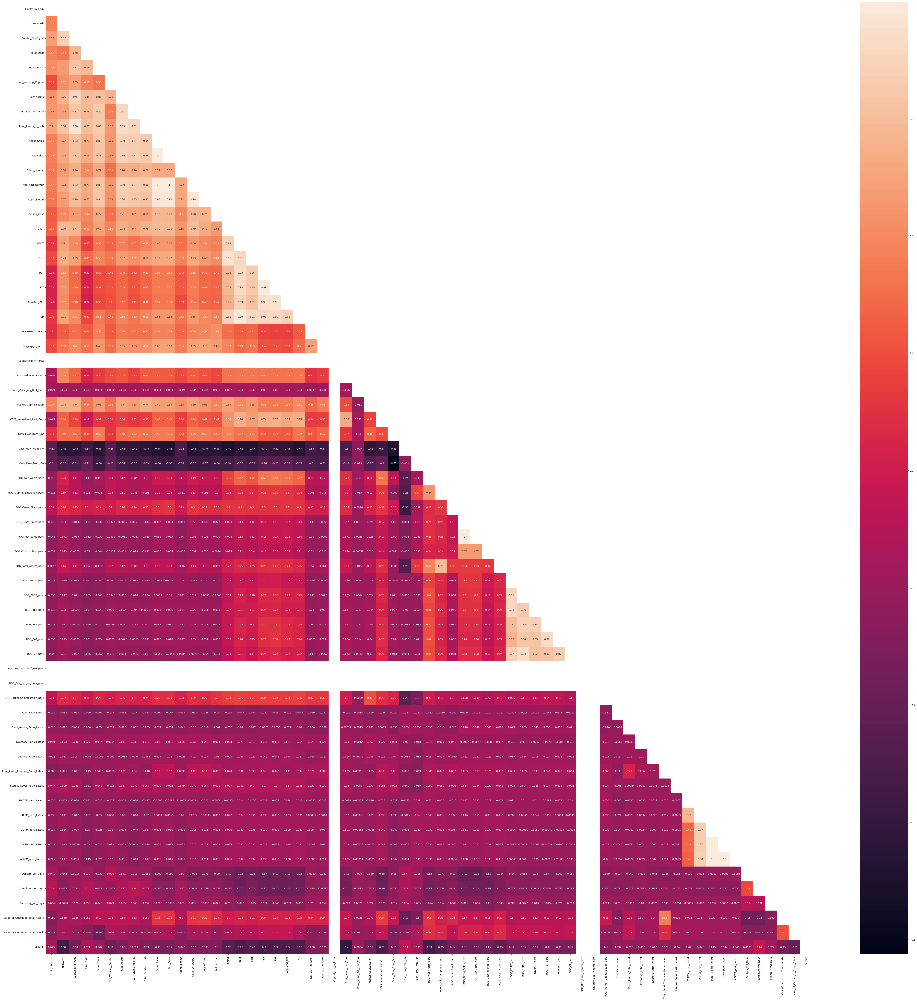

In [33]:
plt.figure(figsize=(70,70))
sns.heatmap(df.corr(),annot=True,mask=np.triu(df.corr()))

In [34]:
#Dropping the columns which do not contribute to the output
df.drop(['Capital_exp_in_forex','ROG_Rev_exp_in_forex_perc','ROG_Rev_earn_in_forex_perc'],axis=1,inplace=True)

<Axes: >

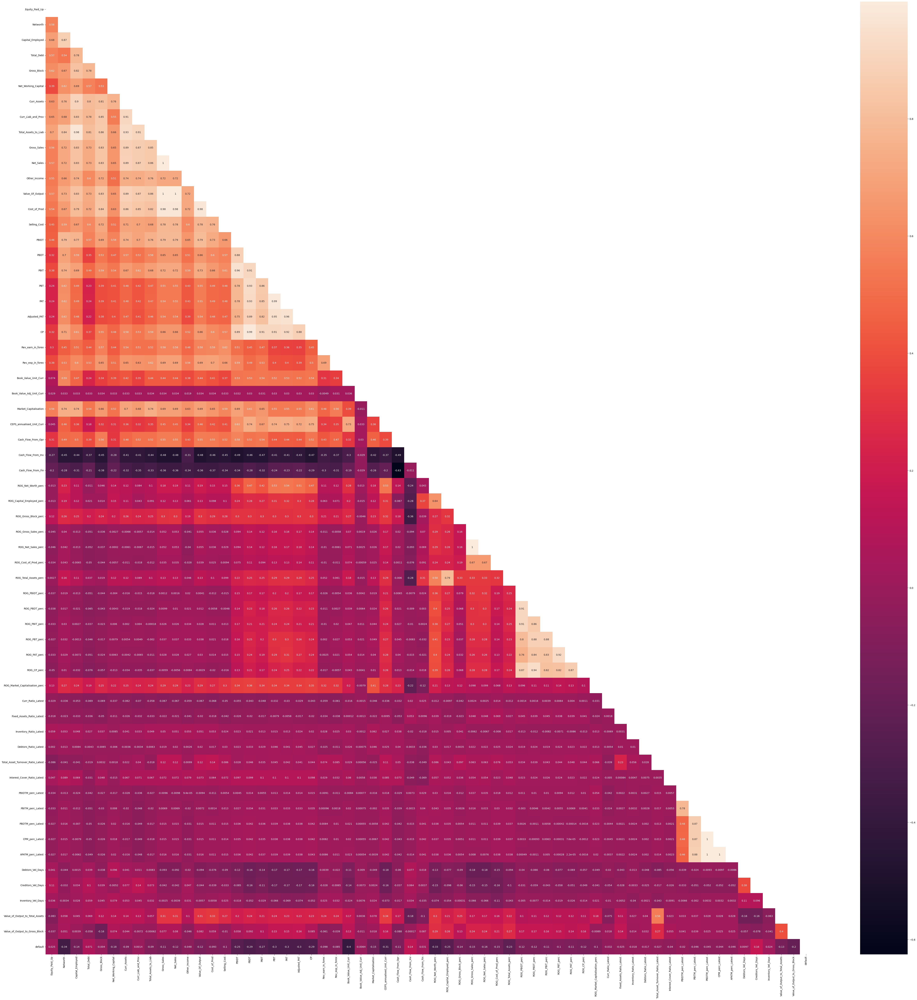

In [35]:
plt.figure(figsize=(70,70))
sns.heatmap(df.corr(),annot=True,mask=np.triu(df.corr()))

In [36]:
corr_matrix=df.corr().abs()
upper_tri=corr_matrix.where(np.triu(np.ones(corr_matrix.shape),k=1).astype(np.bool))

In [37]:
drop_col= [column for column in upper_tri.columns if any(upper_tri[column] > 0.90)]
print(drop_col)

['Curr_Assets', 'Curr_Liab_and_Prov', 'Total_Assets_to_Liab', 'Net_Sales', 'Value_Of_Output', 'Cost_of_Prod', 'PBIT', 'PBT', 'PAT', 'Adjusted_PAT', 'CP', 'ROG_Net_Sales_perc', 'ROG_PBDT_perc', 'ROG_PBIT_perc', 'ROG_PAT_perc', 'ROG_CP_perc', 'CPM_perc_Latest', 'APATM_perc_Latest']


* All these variables are highly correlated with correlation of more than 90% 

In [38]:
# Dropping the above columns.
df.drop(['Curr_Assets', 'Curr_Liab_and_Prov', 'Total_Assets_to_Liab', 'Net_Sales', 'Value_Of_Output', 'Cost_of_Prod', 'PBIT', 'PBT', 'PAT', 'Adjusted_PAT', 'CP', 'ROG_Net_Sales_perc', 'ROG_PBDT_perc', 'ROG_PBIT_perc', 'ROG_PAT_perc', 'ROG_CP_perc', 'CPM_perc_Latest', 'APATM_perc_Latest'],axis=1,inplace=True)

In [39]:
df.shape

(3586, 44)

<Axes: >

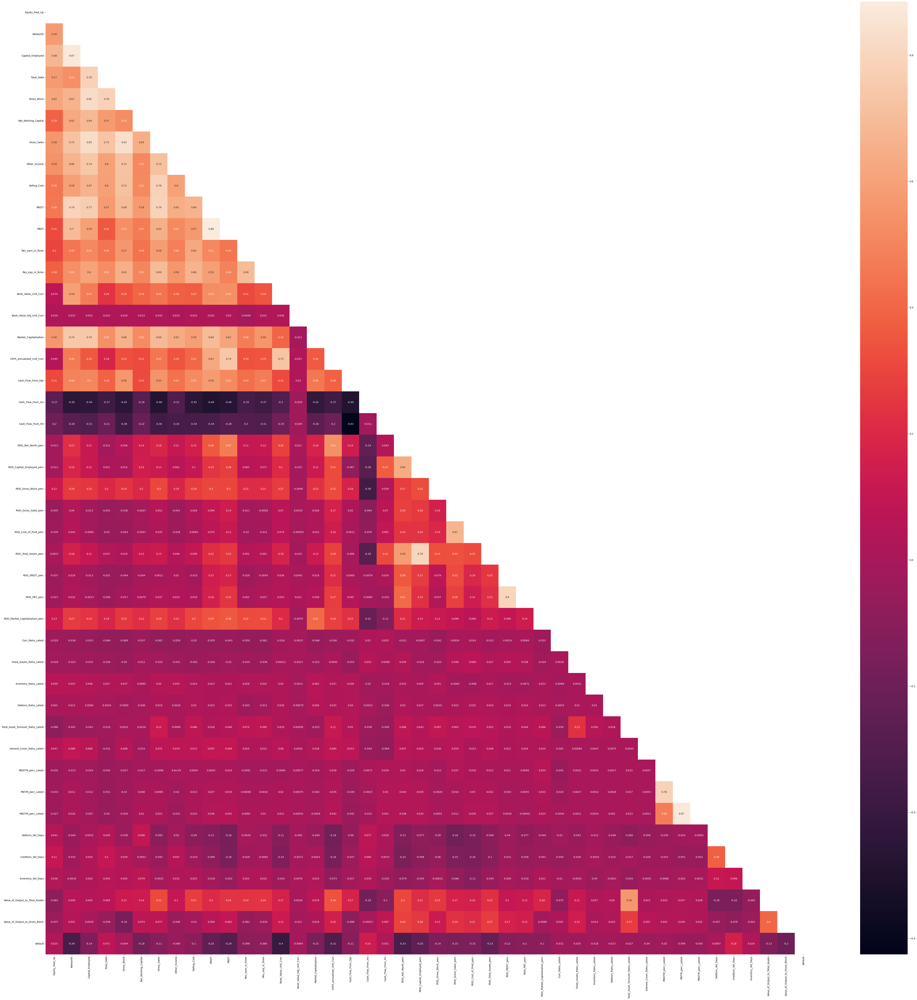

In [40]:
plt.figure(figsize=(70,70))
sns.heatmap(df.corr(),annot=True,mask=np.triu(df.corr()))

### Train Test Split

In [41]:
# defining X and y variables
X = df.drop(["default"], axis=1)
y = df["default"]

print(X.head())
print(y.head())

   Equity_Paid_Up  Networth  Capital_Employed  Total_Debt  Gross_Block  \
0        43.16875  -166.215        -320.90125      180.83     328.8825   
1        43.16875  -166.215         555.10875      180.83     328.8825   
2        43.16875   287.405         555.10875      180.83     328.8825   
3        43.16875  -166.215         555.10875      180.83     328.8825   
4        43.16875  -166.215         555.10875      180.83     328.8825   

   Net_Working_Capital  Gross_Sales  Other_Income  Selling_Cost    PBIDT  ...  \
0            -89.40625      0.00000        7.6000       0.00000 -35.1875  ...   
1            -89.40625    603.46125        9.0575       9.70625  58.7525  ...   
2            151.52375    392.13000        9.0575       9.70625 -35.1875  ...   
3            -89.40625    603.46125        9.0575       3.34000 -35.1875  ...   
4            151.52375     38.72000        9.0575       1.97000 -35.1875  ...   

   Total_Asset_Turnover_Ratio_Latest  Interest_Cover_Ratio_Latest  \

In [42]:
#Scaling the data
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
X=pd.DataFrame(scaler.fit_transform(X),columns=X.columns)

In [43]:
X.head()

,Equity_Paid_Up,Networth,Capital_Employed,Total_Debt,Gross_Block,Net_Working_Capital,Gross_Sales,Other_Income,Selling_Cost,PBIDT,...,Total_Asset_Turnover_Ratio_Latest,Interest_Cover_Ratio_Latest,PBIDTM_perc_Latest,PBITM_perc_Latest,PBDTM_perc_Latest,Debtors_Vel_Days,Creditors_Vel_Days,Inventory_Vel_Days,Value_of_Output_to_Total_Assets,Value_of_Output_to_Gross_Block
0,2.08394,-2.124536,-2.277679,1.955653,2.011189,-2.126873,-0.711425,1.501295,-0.666143,-2.077966,...,-0.463186,-0.047295,0.028499,0.035717,0.028528,-0.919807,-0.916426,-0.252398,-0.943213,-0.818491
1,2.08394,-2.124536,1.937167,1.955653,2.011189,-2.126873,1.980032,1.924923,1.942957,1.877612,...,-0.350951,-0.049115,0.022760,0.022717,0.023239,-0.565502,0.565924,-0.568229,-0.543155,-0.759968
2,2.08394,1.892586,1.937167,1.955653,2.011189,1.933358,1.037488,1.924923,1.942957,-2.077966,...,-0.463186,-0.053011,-2.913131,-1.769114,-0.684044,0.265280,2.173027,-0.582919,-0.981928,-0.881892
3,2.08394,-2.124536,1.937167,1.955653,2.011189,-2.126873,1.980032,1.924923,0.231669,-2.077966,...,-0.463186,-0.047181,0.026644,0.033359,0.024120,0.216411,0.008208,-0.568229,-0.633491,-0.355179
4,2.08394,-2.124536,1.937167,1.955653,2.011189,1.933358,-0.538733,1.924923,-0.136595,-2.077966,...,-0.459445,-0.048802,-0.136187,-0.095319,-0.048944,2.171193,2.173027,-0.582919,-0.930308,-0.806299


In [44]:
# splitting the data in 67:33 ratio for train to test data with random_state=42
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

In [45]:
print("Number of rows in train data =", X_train.shape[0])
print("Number of rows in test data =", X_test.shape[0])

Number of rows in train data = 2402
Number of rows in test data = 1184


### Build Logistic Regression Model (using statsmodel library) on most important variables on Train Dataset and choose the optimum cutoff. Also showcase your model building approach

In [46]:
import statsmodels.api as sm

In [47]:
log_reg1 = sm.Logit(y_train, X_train.astype(float)).fit(
    disp=False
)  # setting disp=False will remove the information on number of iterations

print(log_reg1.summary())

                           Logit Regression Results                           
Dep. Variable:                default   No. Observations:                 2402
Model:                          Logit   Df Residuals:                     2359
Method:                           MLE   Df Model:                           42
Date:                Sun, 10 Mar 2024   Pseudo R-squ.:                 -0.4642
Time:                        20:17:55   Log-Likelihood:                -1158.7
converged:                       True   LL-Null:                       -791.34
Covariance Type:            nonrobust   LLR p-value:                     1.000
                                        coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
Equity_Paid_Up                       -0.0492      0.088     -0.559      0.576      -0.221       0.123
Networth                             -1.3999      0.250     -5

In [48]:
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,f1_score,
    confusion_matrix,
    ConfusionMatrixDisplay)

In [49]:
# defining a function to compute different metrics to check performance of a classification model built using statsmodels
def model_performance_classification_statsmodels(
    model, predictors, target, threshold=0.5
):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    threshold: threshold for classifying the observation as class 1
    """

    # checking which probabilities are greater than threshold
    pred_temp = model.predict(predictors) > threshold
    # rounding off the above values to get classes
    pred = np.round(pred_temp)

    acc = accuracy_score(target, pred)  # to compute Accuracy
    recall = recall_score(target, pred)  # to compute Recall
    precision = precision_score(target, pred)  # to compute Precision
    f1 = f1_score(target, pred)  # to compute F1-score

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {"Accuracy": acc, "Recall": recall, "Precision": precision, "F1": f1,},
        index=[1],
    )

    return df_perf

In [50]:
print("Training performance:")
model_performance_classification_statsmodels(log_reg1, X_train, y_train)

Training performance:


,Accuracy,Recall,Precision,F1
1,0.915487,0.591837,0.584677,0.588235


In [51]:
print("Test performance:")
model_performance_classification_statsmodels(log_reg1, X_test, y_test)

Test performance:


,Accuracy,Recall,Precision,F1
1,0.894426,0.601399,0.558442,0.579125


In [52]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif_series = pd.Series(
    [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])],
    index=X_train.columns,
    dtype=float,
)
print("Series before feature selection: \n\n{}\n".format(vif_series))

Series before feature selection: 

Equity_Paid_Up                         2.489536
Networth                               8.336749
Capital_Employed                      13.252177
Total_Debt                             4.457268
Gross_Block                            6.202431
Net_Working_Capital                    2.213461
Gross_Sales                            7.553685
Other_Income                           2.675127
Selling_Cost                           3.136792
PBIDT                                  9.185975
PBDT                                   8.024183
Rev_earn_in_forex                      2.159881
Rev_exp_in_forex                       2.642721
Book_Value_Unit_Curr                   3.463897
Book_Value_Adj_Unit_Curr               1.017833
Market_Capitalisation                  3.092892
CEPS_annualised_Unit_Curr              4.848268
Cash_Flow_From_Opr                     3.003937
Cash_Flow_From_Inv                     2.129351
Cash_Flow_From_Fin                     2.596206
ROG_N

In [53]:
X_train1 = X_train.drop("PBIDTM_perc_Latest", axis=1)
vif_series1 = pd.Series(
    [variance_inflation_factor(X_train1.values, i) for i in range(X_train1.shape[1])],
    index=X_train1.columns,
)
print("Series before feature selection: \n\n{}\n".format(vif_series1))

Series before feature selection: 

Equity_Paid_Up                        2.483607
Networth                              8.326934
Capital_Employed                     13.251727
Total_Debt                            4.457117
Gross_Block                           6.190007
Net_Working_Capital                   2.212979
Gross_Sales                           7.551314
Other_Income                          2.675082
Selling_Cost                          3.133785
PBIDT                                 9.184878
PBDT                                  8.023635
Rev_earn_in_forex                     2.159770
Rev_exp_in_forex                      2.642544
Book_Value_Unit_Curr                  3.463849
Book_Value_Adj_Unit_Curr              1.017821
Market_Capitalisation                 3.092799
CEPS_annualised_Unit_Curr             4.844459
Cash_Flow_From_Opr                    3.003813
Cash_Flow_From_Inv                    2.129011
Cash_Flow_From_Fin                    2.596127
ROG_Net_Worth_perc       

In [54]:
X_train2 = X_train1.drop("Capital_Employed", axis=1)
vif_series2 = pd.Series(
    [variance_inflation_factor(X_train2.values, i) for i in range(X_train2.shape[1])],
    index=X_train2.columns,
)
print("Series before feature selection: \n\n{}\n".format(vif_series2))

Series before feature selection: 

Equity_Paid_Up                       2.424716
Networth                             5.397431
Total_Debt                           3.607878
Gross_Block                          5.873053
Net_Working_Capital                  2.144938
Gross_Sales                          7.453837
Other_Income                         2.646467
Selling_Cost                         3.126097
PBIDT                                9.142414
PBDT                                 7.927066
Rev_earn_in_forex                    2.159163
Rev_exp_in_forex                     2.638621
Book_Value_Unit_Curr                 3.463182
Book_Value_Adj_Unit_Curr             1.017793
Market_Capitalisation                3.083353
CEPS_annualised_Unit_Curr            4.843707
Cash_Flow_From_Opr                   2.990263
Cash_Flow_From_Inv                   2.124042
Cash_Flow_From_Fin                   2.593471
ROG_Net_Worth_perc                   2.497450
ROG_Capital_Employed_perc            3.783908

In [55]:
X_train3 = X_train2.drop("PBIDT", axis=1)
vif_series3 = pd.Series(
    [variance_inflation_factor(X_train3.values, i) for i in range(X_train3.shape[1])],
    index=X_train3.columns,
)
print("Series before feature selection: \n\n{}\n".format(vif_series3))

Series before feature selection: 

Equity_Paid_Up                       2.411566
Networth                             5.117591
Total_Debt                           3.313112
Gross_Block                          5.871665
Net_Working_Capital                  2.142515
Gross_Sales                          7.278336
Other_Income                         2.639044
Selling_Cost                         3.125041
PBDT                                 4.725569
Rev_earn_in_forex                    2.157234
Rev_exp_in_forex                     2.638616
Book_Value_Unit_Curr                 3.457754
Book_Value_Adj_Unit_Curr             1.017792
Market_Capitalisation                3.076641
CEPS_annualised_Unit_Curr            4.841240
Cash_Flow_From_Opr                   2.966811
Cash_Flow_From_Inv                   2.120272
Cash_Flow_From_Fin                   2.583323
ROG_Net_Worth_perc                   2.497088
ROG_Capital_Employed_perc            3.755735
ROG_Gross_Block_perc                 1.331661

In [56]:
X_train4 = X_train3.drop("Gross_Sales", axis=1)
vif_series4 = pd.Series(
    [variance_inflation_factor(X_train4.values, i) for i in range(X_train4.shape[1])],
    index=X_train4.columns,
)
print("Series before feature selection: \n\n{}\n".format(vif_series4))

Series before feature selection: 

Equity_Paid_Up                       2.388745
Networth                             5.117331
Total_Debt                           3.186824
Gross_Block                          5.181582
Net_Working_Capital                  2.072313
Other_Income                         2.571153
Selling_Cost                         2.936973
PBDT                                 4.589283
Rev_earn_in_forex                    2.150185
Rev_exp_in_forex                     2.577269
Book_Value_Unit_Curr                 3.456293
Book_Value_Adj_Unit_Curr             1.017777
Market_Capitalisation                3.059429
CEPS_annualised_Unit_Curr            4.841075
Cash_Flow_From_Opr                   2.965848
Cash_Flow_From_Inv                   2.113421
Cash_Flow_From_Fin                   2.570920
ROG_Net_Worth_perc                   2.494410
ROG_Capital_Employed_perc            3.754463
ROG_Gross_Block_perc                 1.331168
ROG_Gross_Sales_perc                 2.081750

In [57]:
log_reg4 = sm.Logit(y_train, X_train4).fit(
    disp=False
)  # setting disp=False will remove the information on number of iterations

print(log_reg4.summary())

                           Logit Regression Results                           
Dep. Variable:                default   No. Observations:                 2402
Model:                          Logit   Df Residuals:                     2363
Method:                           MLE   Df Model:                           38
Date:                Sun, 10 Mar 2024   Pseudo R-squ.:                 -0.8457
Time:                        20:18:51   Log-Likelihood:                -1460.6
converged:                       True   LL-Null:                       -791.34
Covariance Type:            nonrobust   LLR p-value:                     1.000
                                        coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------
Equity_Paid_Up                        0.1111      0.075      1.483      0.138      -0.036       0.258
Networth                             -1.1015      0.142     -7

In [58]:
# initial list of columns
cols = X_train4.columns.tolist()

# setting an initial max p-value
max_p_value = 1

while len(cols) > 0:
    # defining the train set
    X_train_aux = X_train4[cols]

    # fitting the model
    model = sm.Logit(y_train, X_train_aux).fit(disp=False)

    # getting the p-values and the maximum p-value
    p_values = model.pvalues
    max_p_value = max(p_values)

    # name of the variable with maximum p-value
    feature_with_p_max = p_values.idxmax()

    if max_p_value > 0.05:
        cols.remove(feature_with_p_max)
    else:
        break

selected_features = cols
print(selected_features)

['Networth', 'Total_Debt', 'Gross_Block', 'Other_Income', 'Book_Value_Unit_Curr', 'ROG_Net_Worth_perc', 'Debtors_Vel_Days', 'Creditors_Vel_Days']


In [59]:
X_train5 = X_train4[selected_features]

In [60]:
log_reg5 = sm.Logit(y_train, X_train5).fit(
    disp=False
)  # setting disp=False will remove the information on number of iterations

print(log_reg5.summary())

                           Logit Regression Results                           
Dep. Variable:                default   No. Observations:                 2402
Model:                          Logit   Df Residuals:                     2394
Method:                           MLE   Df Model:                            7
Date:                Sun, 10 Mar 2024   Pseudo R-squ.:                 -0.8620
Time:                        20:19:05   Log-Likelihood:                -1473.5
converged:                       True   LL-Null:                       -791.34
Covariance Type:            nonrobust   LLR p-value:                     1.000
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
Networth                -0.9899      0.103     -9.595      0.000      -1.192      -0.788
Total_Debt               0.3270      0.079      4.114      0.000       0.171       0.483
Gross_Block 

In [61]:
# defining a function to plot the confusion_matrix of a classification model


def confusion_matrix_statsmodels(model, predictors, target, threshold=0.5):
    """
    To plot the confusion_matrix with percentages

    model: classifier
    predictors: independent variables
    target: dependent variable
    threshold: threshold for classifying the observation as class 1
    """
    y_pred = model.predict(predictors) > threshold
    cm = confusion_matrix(target, y_pred)
    labels = np.asarray(
        [
            ["{0:0.0f}".format(item) + "\n{0:.2%}".format(item / cm.flatten().sum())]
            for item in cm.flatten()
        ]
    ).reshape(2, 2)

    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=labels, fmt="")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

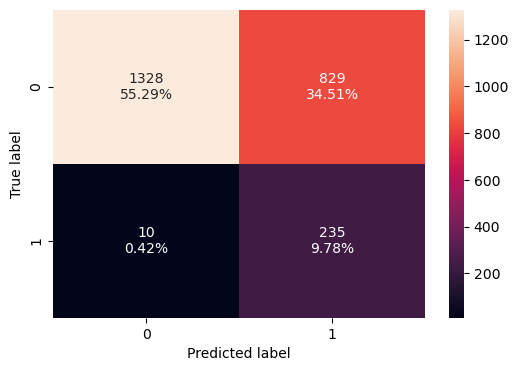

In [62]:
# creating confusion matrix
confusion_matrix_statsmodels(log_reg5, X_train5, y_train)

In [63]:
log_reg_model_train_perf = model_performance_classification_statsmodels(log_reg5, X_train5, y_train)

print("Training performance:")
log_reg_model_train_perf

Training performance:


,Accuracy,Recall,Precision,F1
1,0.650708,0.959184,0.220865,0.359053


In [64]:
X_test5 = X_test[list(X_train5.columns)]

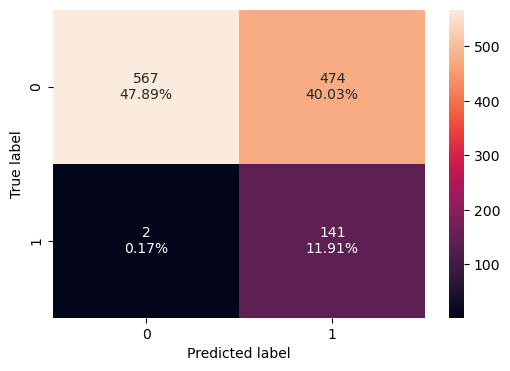

In [65]:
confusion_matrix_statsmodels(log_reg5, X_test5, y_test)

In [66]:
log_reg_model_test_perf = model_performance_classification_statsmodels(log_reg5, X_test5, y_test)

print("Test performance:")
log_reg_model_test_perf

Test performance:


,Accuracy,Recall,Precision,F1
1,0.597973,0.986014,0.229268,0.372032


### Choosing optimal threshold

In [70]:
# Optimal threshold as per AUC-ROC curve
# The optimal cut off would be where tpr is high and fpr is low
fpr, tpr, thresholds = roc_curve(y_train, log_reg5.predict(X_train5))

optimal_idx = np.argmax(tpr - fpr)
optimal_threshold_auc_roc = thresholds[optimal_idx]
print(optimal_threshold_auc_roc)

0.5591623359669732


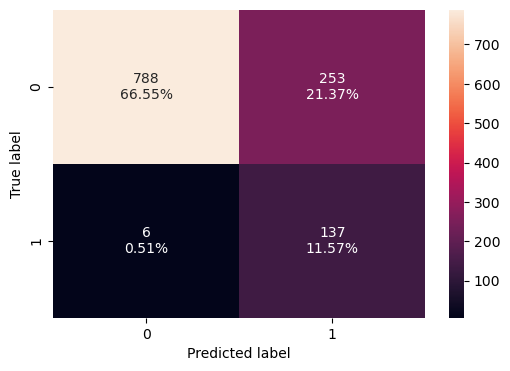

In [71]:
# creating confusion matrix
confusion_matrix_statsmodels(
    log_reg5, X_test5, y_test, threshold=optimal_threshold_auc_roc
)

In [72]:
# checking model performance for this model
log_reg_model_train_perf_threshold_auc_roc = model_performance_classification_statsmodels(
    log_reg5, X_test5, y_test, threshold=optimal_threshold_auc_roc
)
print("Test performance:")
log_reg_model_train_perf_threshold_auc_roc

Test performance:


,Accuracy,Recall,Precision,F1
1,0.78125,0.958042,0.351282,0.514071
